# Finding Edges

Finding edges in images is the first step in many image processing algorithms.  Here we will look at simple edge detection mechanisms available in OpenCV.  We will extract the edges, then use them as an artistic effect and add them back to the original images.  This will make the images appear as if they had the edges inked in, similar to comic book drawings.

In [1]:
%matplotlib inline

import cv2
import scipy.interpolate
import numpy as np
from matplotlib import pyplot as plt

---

We define the `strokeEdges()` function to take a BGR format image, possibly blur it, convert it to grayscale, and then to run one of the available edge detection filters on the image.  Each of these filters will create an image of the same size as the source image, where the edges are outlined in high values (white) and lack of edges show up as low values (black).

We want to apply the edges back to the original image.  To do this we want to leave the areas of the image without edges unchanged, while we make black the locations that have edges.  We can do this by creating a mask that has black edges.  We can then take the mask and scale it to have values between 0 (make black) and 1 (unchanged).  Then doing an element by element multiply of this mask with the original image.  This has the effect fo adding those black edges to the image.  This is done and placed into the destination image.

We then return the black edged image from the function.

In [2]:
def strokeEdges(src, dst, blurSize = 7, edgeSize = 5, which = 'Laplacian'):
    if blurSize > 3:
        blurredSrc = cv2.medianBlur(src,blurSize)
        graySrc = cv2.cvtColor(blurredSrc,cv2.COLOR_BGR2GRAY)
    else:
        graySrc = cv2.cvtColor(src,cv2.COLOR_BGR2GRAY)
        
    graySrc = {
      'Laplacian' : lambda x: cv2.Laplacian(graySrc, cv2.CV_8U, ksize=edgeSize),
      'SobelX'    : lambda x: cv2.Sobel(    graySrc, cv2.CV_8U, 1, 0, ksize=edgeSize),
      'SobelY'    : lambda x: cv2.Sobel(    graySrc, cv2.CV_8U, 0, 1, ksize=edgeSize),
      'ScharrX'   : lambda x: cv2.Scharr(   graySrc, cv2.CV_8U, 1, 0),
      'ScharrY'   : lambda x: cv2.Scharr(   graySrc, cv2.CV_8U, 0, 1)
    }.get(which,lambda x:None)(0)
        
        
    blackEdges = 255 - graySrc
    normalizedInverseAlpha = (1.0 / 255) * blackEdges
    channels = cv2.split(src)
    for channel in channels:
        channel[:] = channel * normalizedInverseAlpha
    cv2.merge(channels, dst)
    
    return(blackEdges)

---

### Adding Edges to Images

Here we take three source images, detect edges, and then add those back to the original image for an artistic effect.

The first image we do this with is the collection of modified faces we have seen previously.  We can see that the edges are detected well and the combined image looks like it has been inked as if it were a comic book drawing.

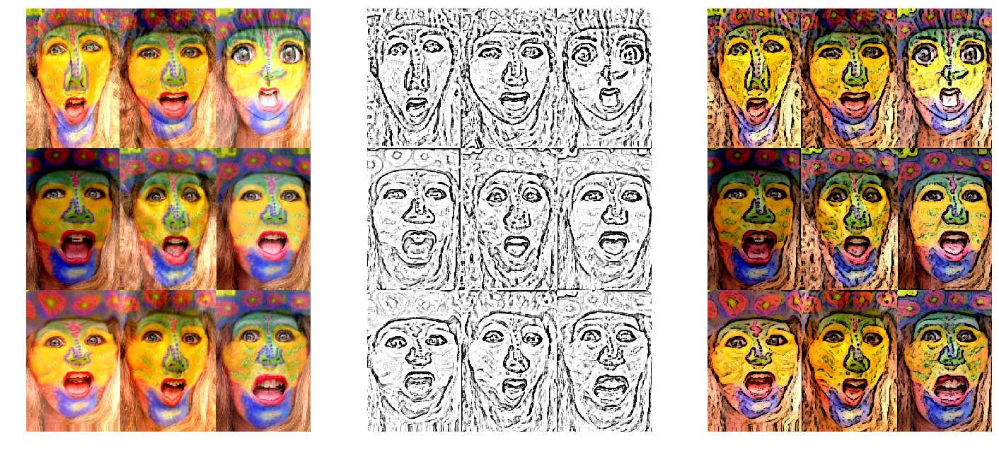

In [3]:
bgr_image = cv2.imread('faces.jpg')
rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

edges = strokeEdges(bgr_image,bgr_image); combined_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
fig,ax = plt.subplots(1,3)
fig.set_size_inches(22.0,12.0); fig.set_dpi(80)
ax[0].set_axis_off();ax[1].set_axis_off();ax[2].set_axis_off();
ax[0].imshow(rgb_image)
ax[1].imshow(edges, cmap='gray')
xx = ax[2].imshow(combined_image)

---

Looking at the results for the students image we have seen previously, we see good edge detection but the combined image is not as crisp s we would like.

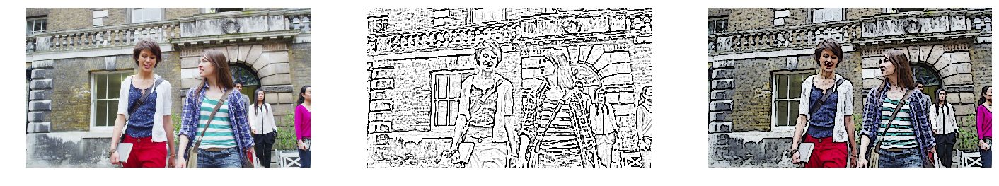

In [4]:
bgr_image = cv2.imread('students.jpg')
rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

edges = strokeEdges(bgr_image,bgr_image); combined_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
fig,ax = plt.subplots(1,3)
fig.set_size_inches(22.0,12.0); fig.set_dpi(80)
ax[0].set_axis_off();ax[1].set_axis_off();ax[2].set_axis_off();
ax[0].imshow(rgb_image)
ax[1].imshow(edges, cmap='gray')
ax[2].imshow(combined_image)

---

Looking at the results from the prevous portrait image, we also see good edge detection and an artisitc effect.

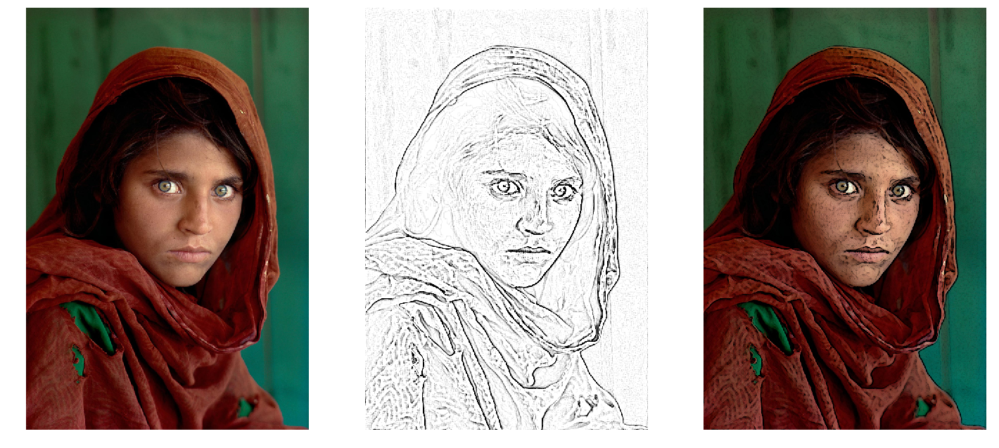

In [5]:
bgr_image = cv2.imread('portrait.jpg')
rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

edges = strokeEdges(bgr_image,bgr_image); combined_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
fig,ax = plt.subplots(1,3)
fig.set_size_inches(22.0,12.0); fig.set_dpi(80)
ax[0].set_axis_off();ax[1].set_axis_off();ax[2].set_axis_off();
ax[0].imshow(rgb_image)
ax[1].imshow(edges, cmap='gray')
ax[2].imshow(combined_image)

---

### Different Edge Detection Algorithms

OpenCV includes many edge detection algorithms.  Some of those were included in the `strokeEdges()` function definition above.  Lets define `plotEdges()` function here that lets us create a grid of images that have a row for each treatment: top row is original image, subsequent rows include various edge detection algorithms and paramter settings.

This will allow us to examine the performance from the different algorithms and settings.

The filter algorithms that we will examine include:
- Laplacian edge detection
- Sobel horizontal edge detection
- Sobel vertical edge detection
- Scharr horizontal edge detection
- Scharr vertical edge detection

In [6]:
def plotEdges(imagefiles,rownames,filternames,blurSize=7):
    fig, big_axes = plt.subplots(figsize=(15.0, 45.0),
                                 nrows=len(rownames),
                                 ncols=1, sharey=True) 

    for row, big_ax in enumerate(big_axes):
        big_ax.set_title(rownames[row], fontsize=16, y = 1.06)
        big_ax.set_axis_off(); big_ax.set_frame_on(False)

    bgr = []
    for index, imagefile in enumerate(imagefiles):
        bgr.append(cv2.imread(imagefile))
        rgb_image = cv2.cvtColor(bgr[index], cv2.COLOR_BGR2RGB)
        ax = fig.add_subplot(6,3,index+1); ax.set_axis_off()
        ax.imshow(rgb_image)

    for index, which in enumerate(filternames,start=1):
        for col in range(3):
            edges = strokeEdges(bgr[col],bgr[col], which=which)
            ax = fig.add_subplot(6,3,(3*index+col+1))
            ax.set_axis_off()
            ax.imshow(edges,cmap='gray')

---
Lets define some row image files and filter parameters to explore

In [7]:
imagefiles  = ['faces.jpg','students.jpg','portrait.jpg']
rownames    = ['Original Images',
               'Laplacian Edges',
               'Sobel X Edges',
               'Sobel Y Edges',
               'Scharr X Edges',
               'Scharr Y Edges']
filternames = ['Laplacian',
               'SobelX',
               'SobelY',
               'ScharrX',
               'ScharrY']

---
Lets look at the three image files we have been using along with each of the edge detection algorithms.

We can see that the best edge detection results are when using the _Laplacian_ edge detection algorithm.  The various Sobel and Scharr edge detection results are somewhat less clear.

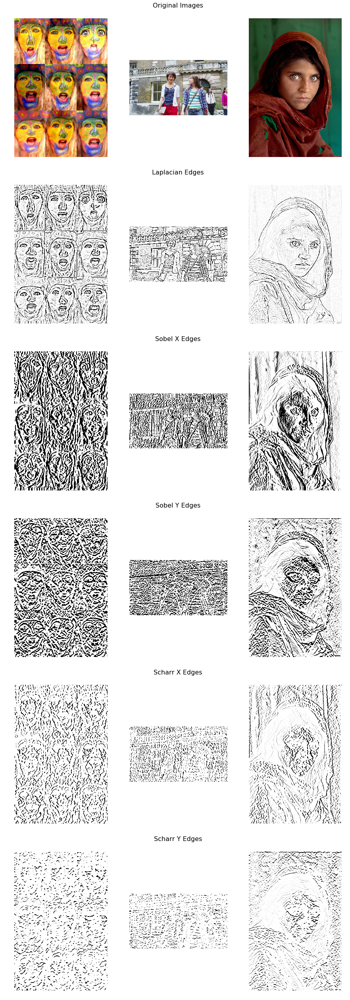

In [8]:
plotEdges(imagefiles,rownames,filternames)

---

In addition to the edge detection algorithm, the processing we have been doing has been blurring the image with a 7x7 filter.  Lets see what happens if we do not perform blurring before detecting the edges.

We can see that the results of edge detection is visibly similar to the performance of the detections with a default blur kernel of 7x7.

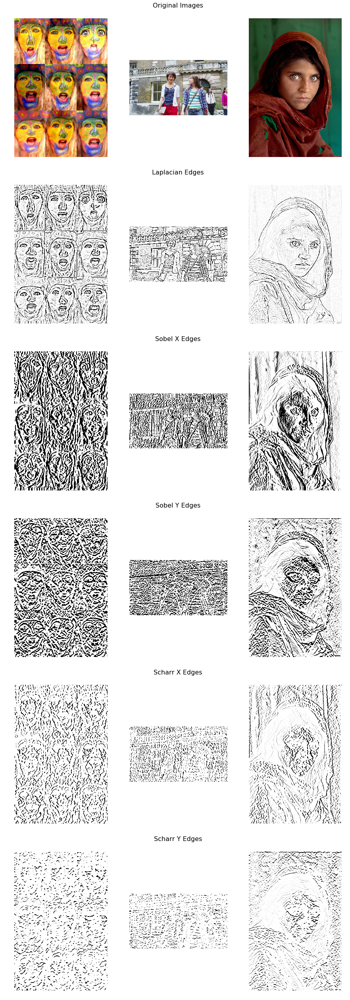

In [9]:
plotEdges(imagefiles,rownames,filternames,blurSize=3)

---

So what happens when we blur with a larger kernel size?  Here we use a 9x9 kernel, and we see that the algorithms other than the _Laplacian_ all appear to have degraded edge detection performance.  This appears to be a result of detecting *too* many edges.  This is a bit counter-intuitive as we would expect there to be fewer edges when the blur kernel is larger.

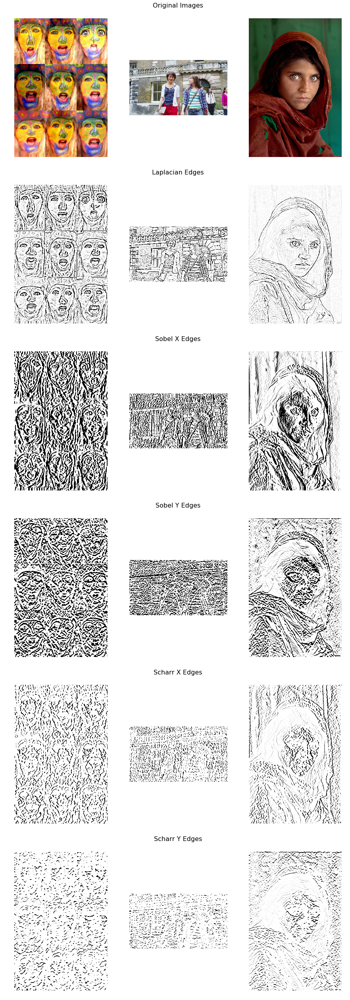

In [10]:
plotEdges(imagefiles,rownames,filternames,blurSize=9)